# Final Project: Space-Time Interaction of Armed Conflict  Events in Nigeria
Becky Davies

December 13, 2016

**Background**

The [Armed Conflict Location and Event Data Project (ACLED)](http://www.acleddata.com/) provides data on events of political unrest in Africa and South Asia. The data is collected by researchers at the University of Sussex and gleaned from various outlets including media, research, and organizational reports. The data ranges from 1997 to the present and can be downloaded from the ACLED webpage in various formats, time frames, and geographies.

This analysis uses the 1997 - 2015 Africa data to assess space-time interaction across political or violent events. Given computational constraints, the data is truncated to only focus on events in Nigeria within the given time frame. 

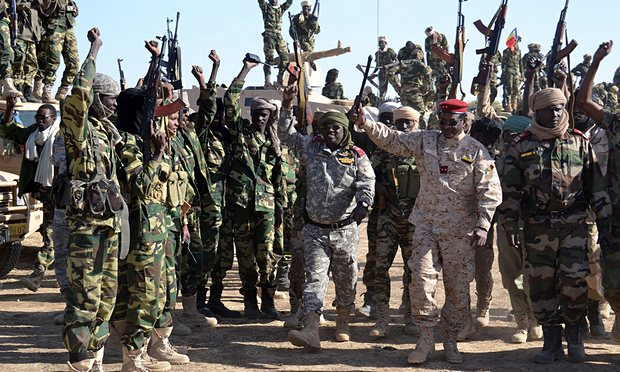

In [1]:
from IPython.display import IFrame, Image, HTML, display, YouTubeVideo
display(Image("./images/Chadian.jpg", width=500, embed=True))

[Image Source](https://www.theguardian.com/world/2015/feb/06/boko-haram-up-to-6000-hardcore-fighters-chad-niger)

Nigeria is the most populous country in Africa and [eighth most populous country](https://www.cia.gov/library/publications/the-world-factbook/rankorder/2119rank.html) in the world. The rise and spread of terrorist group Boko Haram has contributed to substantial unrest in the county. In April, 2014, Boko Haram notoriously kidnapped 276 girls at a boarding school in Borno. However, the group has existed in some form since [as early as 2002](http://www.cnn.com/2014/06/09/world/boko-haram-fast-facts/). While Boko Haram is not the only group of interest in Nigeria, it is one group that could account for the patterns in the spatio-temporal distribution of armed conflict across Nigeria during the study period.

In [1]:
# Import needed libraries
import pysal as ps
import pysal.spatial_dynamics.interaction as interaction
import pandas as pd
import time
import numpy as np
import scipy as sp
import datetime as dt
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt
import geopandas as gp
%config InlineBackend.figure_format = 'svg'
%matplotlib inline
import seaborn as sns  # Makes for nicer plots
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 8, 4
from matplotlib.patches import Ellipse, Circle
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import mpl_toolkits.mplot3d.art3d as art3d
from mpl_toolkits.mplot3d import proj3d
from ipywidgets import interact, interactive, fixed
from mpl_toolkits.basemap import Basemap
import utm
from shapely.geometry import Point
from scipy.spatial import distance

**Data**

There are 117823 events contained in the ACLED dataset for all of Africa from 1997-2015. Each event contains information about the main participants in the event, geographic location, fatalities, the source of information about the event, and the event type.

In [3]:
# Read in initial file
acled= gp.read_file('C:/Users/Becky/Appdata/Local/Enthought/Canopy/User/lib/site-packages/pysal/examples/ACLED/ACLED.shp')
print(len(acled))
acled.head()

117823


,ACTOR1,ACTOR2,ADMIN1,ADMIN2,ADMIN3,ALLY_ACTOR,ALLY_ACT_1,COUNTRY,EVENT_DATE,EVENT_ID_C,...,INTER2,INTERACTIO,LATITUDE,LOCATION,LONGITUDE,NOTES,SOURCE,TIME_PRECI,YEAR,geometry
0,GIA: Armed Islamic Group,Civilians (Algeria),Blida,Blida,None,None,None,Algeria,1997-01-04,1ALG,...,7.0,27.0,36.4686,Blida,2.82890,4 January: 16 citizens were murdered in the vi...,www.algeria-watch.org,1.0,1997.0,POINT (2.8289 36.4686)
1,GIA: Armed Islamic Group,Civilians (Algeria),Tipaza,Douaouda,None,None,None,Algeria,1997-01-05,2ALG,...,7.0,27.0,36.6725,Douaouda,2.78940,5 January: Killing of 18 citizens in the Olivi...,www.algeria-watch.org,1.0,1997.0,POINT (2.7894 36.6725)
2,GIA: Armed Islamic Group,Civilians (Algeria),Tipaza,Hadjout,None,None,None,Algeria,1997-01-06,3ALG,...,7.0,27.0,36.5139,Hadjout,2.41780,6 January: 23 citizens were horribly mutilated...,www.algeria-watch.org,1.0,1997.0,POINT (2.4178 36.5139)
3,GIA: Armed Islamic Group,Civilians (Algeria),Alger,Bouzareah,None,None,None,Algeria,1997-01-07,4ALG,...,7.0,27.0,36.7525,Algiers,3.04197,7 January: Explosion of a bomb in the Didouche...,www.algeria-watch.org,1.0,1997.0,POINT (3.04197 36.7525)
4,GIA: Armed Islamic Group,Civilians (Algeria),Alger,Ouled Chebel,None,None,None,Algeria,1997-01-11,5ALG,...,7.0,27.0,36.5994,Ouled Chebel,2.99440,11 January: 5 citizens killed in Ouled Chebel ...,www.algeria-watch.org,1.0,1997.0,POINT (2.9944 36.5994)


In [4]:
# Create empty lists for the latitudes and longitudes.
lats, lons = list(acled.LATITUDE.values), list(acled.LONGITUDE.values)

In [5]:
# Visualize data set
eq_map = Basemap(llcrnrlon=-20.5, llcrnrlat=-35.9, urcrnrlon = 52.7, urcrnrlat=38.7, 
                 projection='merc', resolution = 'l', area_thresh = 1000.0)
eq_map.drawcoastlines()
eq_map.drawcountries()
eq_map.fillcontinents(color = 'white')
eq_map.drawmapboundary()
eq_map.drawmeridians(np.arange(0, 360, 30))
eq_map.drawparallels(np.arange(-90, 90, 30))
 
x,y = eq_map(lons, lats)
eq_map.plot(x, y, 'ro', markersize=2)
 
plt.show()

The map above shows all events in the ACLED Africa data set. Clear concentrations of events exist, particularly on the southern coast of west Africa, throughout Nigeria, along the central west coast, in the regions surrounding Ethopia, Somalia, & South Sudan, throughout Zimbabwe, in a cluster around Rwanda and Uganda, and in the eastern half of South Africa. Viewing this map, one must consider the effects of population density upon the likelihood of an event. For instance, there are few events in the Saharan desert, where population density is low. The visual distribution of events may be indicative of high levels of violence, high levels of population, high levels of media coverage, or any combination of those three.

In [6]:
# Select only records that match Nigeria
nigeria = acled[acled.COUNTRY == 'Nigeria']
# Write to file
nigeria.to_file("C:/Users/Becky/Appdata/Local/Enthought/Canopy/User/lib/site-packages/pysal/examples/ACLED3/ACLED3.shp")
len(nigeria)

8541

In [7]:
# Convert event date to datetime object
acled.EVENT_DATE = acled.EVENT_DATE.map(lambda s: dt.datetime.strptime(s, '%Y-%m-%d'))

Plotting a count of events grouped by year shows a large increase in events from 2011 onwards. The trend may reflect an actual increase in events, or an increase in reported/recorded events as a product of the increasing ease of accessing and tracking event information through various print and internet sources.

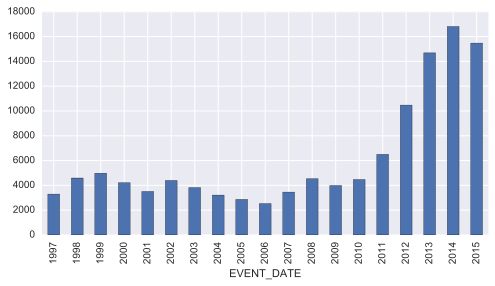

In [8]:
# Plot events by year
fig, ax = plt.subplots(1,1)
acled.EVENT_DATE.groupby([acled.EVENT_DATE.dt.year]).count().plot(kind="bar")
plt.title('Timeline of ACLED Events in Afria, 1997-2015')

*Nigeria* 

Although exploring the space-time interaction for all events woud be most interesting, the computational costs are high, so this exploration will be limited to Nigeria. Selecting only events in Nigeria reduces the data set to 8541 event records (computed above).

In [9]:
# Create empty lists for the latitudes and longitudes.
lats, lons = list(nigeria.LATITUDE.values), list(nigeria.LONGITUDE.values)

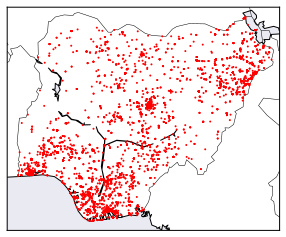

In [10]:
# Visualize data set
eq_map = Basemap(llcrnrlon=2.22, llcrnrlat=3.85, urcrnrlon = 14.94, urcrnrlat=14.13, 
                 projection='merc', resolution = 'l', area_thresh = 1000.0)
eq_map.drawcoastlines()
eq_map.drawcountries()
eq_map.fillcontinents(color = 'white')
eq_map.drawmapboundary()
eq_map.drawmeridians(np.arange(0, 360, 30))
eq_map.drawparallels(np.arange(-90, 90, 30))
 
x,y = eq_map(lons, lats)
eq_map.plot(x, y, 'ro', markersize=2)
 
plt.show()

Mapping all recorded events in Nigeria (above) shows a relatively wide spread of events geographically, with concentrations along the coast, a small concentration in the center, and in the northeast corner of the country. The coordinates are originally in lat/long format. In order to calculate distance between points, they are converted to UTM coordinates for the Nigeria data set.

In [11]:
# Combine lat and long in single column
nigeria['LATLONG'] = list(zip(nigeria.LONGITUDE, nigeria.LATITUDE))

C:\Users\Becky\AppData\Local\Enthought\Canopy\User\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [12]:
# Convert lat and long to UTM equivalents
utm_x= []
utm_y = []
for x in range(len(nigeria)):
    units = utm.from_latlon(nigeria.LATLONG.values[x][0], nigeria.LATLONG.values[x][1])
    utm_x.append(units[0])
    utm_y.append(units[1])

In [13]:
# convert to arrays
nigeria['utmX'] = np.asarray(utm_x)
nigeria['utmY'] = np.asarray(utm_y)

C:\Users\Becky\AppData\Local\Enthought\Canopy\User\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
C:\Users\Becky\AppData\Local\Enthought\Canopy\User\lib\site-packages\ipykernel\__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  app.launch_new_instance()


In [14]:
# Convert UTM coordinates to Point and set geometry for shapefile
nigeria['UTM'] = [Point(xy) for xy in zip(nigeria.utmX, nigeria.utmY)]
nigeria = nigeria.set_geometry('UTM')
# Remove redundant columns
nigeria = nigeria.drop("LATLONG", axis=1)
nigeria = nigeria.drop("geometry", axis=1)

C:\Users\Becky\AppData\Local\Enthought\Canopy\User\lib\site-packages\ipykernel\__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app


In [15]:
# Write revised DF to file
nigeria.to_file("C:/Users/Becky/Appdata/Local/Enthought/Canopy/User/lib/site-packages/pysal/examples/ACLED3/ACLED3.shp")

Displaying events by year (below) illustrates, as in the case for the full data set, a strong increase in events in recent years. In Nigeria, conflict events increased notably in 2010, then again from 2012 onwards. Similarly, this could reflect an actual rise in unrest, or improved media and event tracking.

In [16]:
# Convert event date to datetime object
nigeria.EVENT_DATE = nigeria.EVENT_DATE.map(lambda s: dt.datetime.strptime(s, '%Y-%m-%d'))

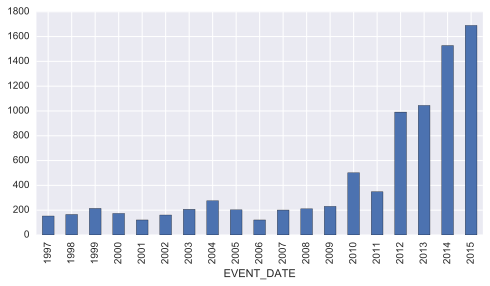

In [17]:
# Plot events by year
fig, ax = plt.subplots(1,1)
nigeria.EVENT_DATE.groupby([acled.EVENT_DATE.dt.year]).count().plot(kind="bar")
plt.title('Timeline of ACLED Events in Nigeria, 1997-2015')

In [2]:
# Create interaction objects
path = ps.examples.get_path("ACLED3.shp")
events = interaction.SpaceTimeEvents(path,'EVENT_DATE')

Time in the ACLED data set is formatted as a string in Y-M-D format. To standardize it in an integer for suitable for measuring space-time interaction, it is converted based on milliseconds since 1970-1-1.

In [3]:
# Convert time to epoch
for x in range(len(events.t)):
    pattern = '%Y-%m-%d'
    events.t[x][0] = int(time.mktime(time.strptime(events.t[x][0], pattern)))
# convert to int
events.t = events.t.astype(int)

Despite subsetting the data to only include events in Nigeria, the data set is still large and thus difficult to visualize effectively without grouping the data. The space-time cube below shows the high density of points in recent years (at the top of the cube) as well as spatial concentration of events, indicated by the high density of points in vertical lines across time. These could be overlapping points marking events that occurred in the same city.

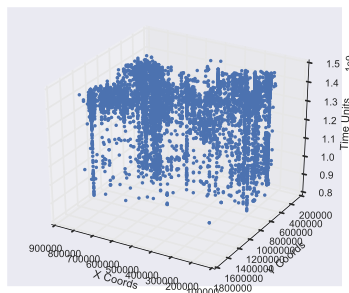

In [20]:
@interact(angle=(0, 240, 5))  # That's all it takes to make it interactive :)
def make_plot(angle):
    fig = plt.figure(figsize=(6, 5))
    ax = fig.gca(projection='3d')
    ax.view_init(30, angle)  # Use 'angle' parameter
    ax.set_ylabel("Y Coords")
    ax.set_xlabel("X Coords")
    ax.set_zlabel("Time Units")
    ax.plot(events.space[:,0], events.space[:,1], events.t[:,0], ".")
    plt.show()

Using a faceted view of the event coordinates helps disaggregate overlapping events into yearly slices, and further illustrates the increasing number and spread of conflict events in recent years.

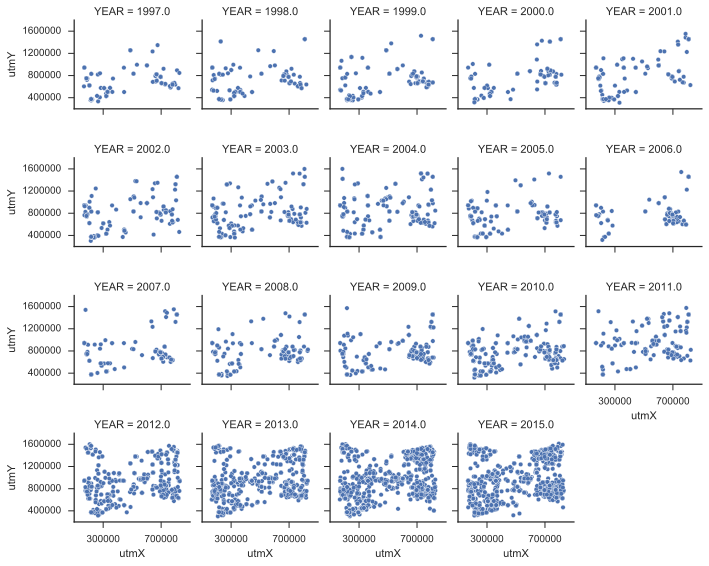

In [21]:
sns.set(style="ticks")

# Initialize a grid of plots with an Axes for each walk
grid = sns.FacetGrid(nigeria, col="YEAR", col_wrap=5, size=2)

grid = grid.map(plt.scatter, "utmX", "utmY", edgecolor="w")
# Draw points for each 

# Adjust the tick positions and labels
grid.set(xticks=[300000, 700000], yticks=[400000, 800000, 1200000, 1600000])

# Adjust the arrangement of the plots
grid.fig.tight_layout(w_pad=1)

### Space-Time Interaction Tests

Understanding whether clustering translates to complex interactions between space and time requires more sophisticated methods. 

*Knox Test*

The initial challenge of running the Knox Test to look for space-time interaction is establishing appropriate parameters for delta, the spatial measure of 'nearness,' and tau, the temporal measure of 'nearness.' Here, I use the mean values of the difference in time and space between all pairs of points.

In [ ]:
# Find distances between all event locations, pairwise
distances = []
for p in events.space:
    for q in events.space:
        dist = distance.euclidean(p, q)
        distances.append(dist)

In [ ]:
# Find mean of distances between all event locations
delta = np.mean(distances)
delta

In [ ]:
# Find difference between all event times, pairwise
times = []
for t in events.t:
    for r in events.t:
        time = abs(t-r)
        times.append(time)

In [ ]:
# Calculate mean difference in time between all event times
tau = np.mean(times)
tau

In [ ]:
# Run Knox test to examine space-time interaction
knox = interaction.knox(events.space, events.t, delta=delta, tau=tau, permutations=99)
knox

Using the mean distance and time for delta and tau, respectively, we can reject the null hypothesis that events are not clustered in space and time. The p-value of 0.01 indicates the presence of space-time interactions in the events.

*Modified Knox Test*

Using the same values in the modified Knox test no space-time interaction is apparent. With a p-value of 0.78, we cannot reject the null hypothesis that no space-time interaction occurs. The conflicting results suggests that altough there may be spatial and temporal clustering, and maybe even spatio-temporal clustering, there is no evidence for space-time interaction of a more complex and identifiable nature.

In [ ]:
mod_knox = interaction.modified_knox(events.space, events.t, delta=delta, tau=tau, permutations=99)
mod_knox

*Mantel Test*

Surprisingly, the Mantel test rejects the null hypothesis that there is no space-time interaction, with a p-value < 0.05. This finding concurs with the simple Knox test but conflicts with the Modified Knox test, which could not reject the null hypothesis.

**Note**: The permutations tested here are reduced to only 50 because the Mantel test is computationally intensive.

In [24]:
mantel = interaction.mantel(events.space, events.t, permutations=50, scon=0.0, spow=1.0, tcon=0.0, tpow=1.0)
mantel

{'pvalue': 0.019607843137254902, 'stat': 0.029812146808802446}

*Jacquez Test*

The Jacquez test failed to solved. Whether the error is an issue with the data set, my computations, or the code is unclear. Looking at the source code, it is clear that the data did not meet two conditions (if statements) that would assign it a value to 'focal,' and so the reference to the variable results in an error. The exact nature of this problem will require more investigation. The Jacquez test would be particularly helpful to address the influence of population density upon event frequency.

In [22]:
jacquez = interaction.jacquez(events.space, events.t ,k=10, permutations=5)
jacquez

UnboundLocalError: local variable 'focal' referenced before assignment

### Conclusion

Despite the density of events and visual clustering, the results of four space-time interaction tests leaves no clear answers. The simple Knox text and Mantel test suggest we can reject null hypothesis that there is no space-time interaction in recorded conflict events in Nigeria. However, the modified Knox text suggests we cannot. The Jacquez test, unfortunately, provides no answers at this time. Clustering may exist in space, or time, or even in space-time, but whether there is deeper pattern that might indicate underlying causes for the distribution of events across the study area requires additional investigation.

It is possible that space-time interactions exist at different spatial or temporal scales than those I've examined here, and that using those scales would result in greater concurrence between the tests. For instance, I could separate events based on their type, or participants. I could examine temporal patterns of events throughout the year (e.g. rainy season vs. dry season) or for more limited time frames, such as fewer years or even months. With more powerful computing resources, I could alternatively scale up, utilizing the entire ACLED Africa dataset instead of a single country. It is also possible that altering my selected paramters for delta and tau could provide different insights.

Although the large data set provides a wealth of events to consider as potentially related, event diversity in other characteristics could have complicated efforts to identify space-time interaction patterns. Perhaps, if too many unrelated events are grouped together then patterns among subsets of that group are obscured.

*Project Notes*

After attempting to test space-time interaction in a lab earlier this semester, I wanted to try again to see if I could successfully run the interaction tests. The original census data I used was not conceptually fitting for the test, so I looked instead to datasets documenting political events, which might have greater likelihood of involving complex space-time patterns. I first choose the SPEED Civil Unrest data collected by the Cline Center for Democracy. I ran into substantial problems converting the data to the correct encoding. I then switched to using the ACLED data, a source I am familiar with from past work. I originally attempted to use the entire ACLED Africa data set but ran into memory problems. 

I found it challenging to determine how to format the space and time inputs in the shapefile for the SpaceTimeEvent objects. No formats are specified in the Pysal documentation, so I decided to standardize the time based on epoch time and to convert the lat/long points to UTM coordinates for better distance calculations and a more intuitive understanding of the meaning of the parameters.